In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.style as style
import geopandas
import datetime as dt
import geopy

style.use('fivethirtyeight')

plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

#### Load Data

In [2]:
def get_year_month_list(start_month, start_year, end_month, end_year):
    '''
    Gets list of years and month, as a string e.g. '1403' for March of 2014, 
    between the given start month/year and end month/year

    Parameters
    ----------
    start_month: int 1-12
    start_year: int 2000+
    end_month: int 1-12
    end_year: int 2000+
    
    Returns
    -------
    year_month_list : list of strings
    '''
    year_month_list = []
    ym_start= 12*start_year + start_month - 1
    ym_end= 12*end_year + end_month 
    for ym in range(ym_start, ym_end):
        y, m = divmod(ym, 12)
        y = str(y)[2:]
        m = '{0:02d}'.format(m+1)
        year_month_list += [y+m]
    return year_month_list

def get_all_citi_df(start_month=4, start_year=2016, 
                          end_month=4, end_year=2021):
    '''
    Gets all Citi bike trip DataFrames within a given date range and 
    concats them together

    Parameters
    ----------
    start_month: int 1-12
    start_year: int 2016-
    end_month: int 1-12
    end_year: int -2021
        
    Returns
    -------
    citi_all : pandas DataFrame
    '''
    year_month_list = get_year_month_list(start_month, start_year, 
                                          end_month, end_year)
    citis = list()
    for year_month in year_month_list:
        citi = pd.read_parquet(f'https://s3.amazonaws.com/ctbk/20{year_month}-citibike-tripdata.parquet')
        citis.append(citi)
    citi_all = pd.concat(citis, axis=0, ignore_index=True)
    return citi_all
# Only going to be looking at Citi Bike data from March and April of 2021
citi = get_all_citi_df(start_month=3, start_year=2021)



#### Add zipcode field

In [3]:
def get_zipcode(df, geolocator, lat_field, lon_field):
    '''
    For eacGets zipcode from given latitude and longitude.

    Parameters
    ----------
    df: pandas DataFrame
    geolocator: geopy.Nominatim object
    lat_field: string
        column name where latitude value is held
    lon_field: string
        column name where longitude value is held
    Returns
    -------
    location.raw['address']['postcode'] : string
        zipcode of location.
    '''
    location = geolocator.reverse((df[lat_field], df[lon_field]))
    try:
        return location.raw['address']['postcode']
    except KeyError:
        return 'XXXXXXXXX'

def update_zip_code_dict(citi_, id_to_zipcode_={}):
    '''
    Checks if any station id's don't have a pre existing zipcode match. 
    updates the zipcode dictionary if there are new matches. 

    Parameters
    ----------
    citi_: pandas DataFrame
    id_to_zipcode_: dictionary
        
    Returns
    -------
    id_to_zipcode_ : dictionary
    '''
    current_id_to_zipcode = list(id_to_zipcode_.keys())
    citi_ = citi_[~citi_['End Station ID'].isin(current_id_to_zipcode)]
    citi_zip = citi_.drop_duplicates(subset=['End Station ID'])[['End Station ID',
                                                                    'End Station Latitude',
                                                                    'End Station Longitude']]
    try:
        geolocator = geopy.Nominatim(user_agent='testing_for_citi_bike')
        citi_zip['zipcodes'] = citi_zip.apply(get_zipcode, axis=1, geolocator=geolocator, 
                                            lat_field='End Station Latitude', 
                                            lon_field='End Station Longitude')
        
        id_to_zipcode_.update(dict(zip(citi_zip['End Station ID'], 
                                      citi_zip['zipcodes'])))
    except ValueError:
        print('No new ZIP codes.')
    return id_to_zipcode_

# Load previously processed stations and their corresponding zipcodes and check for
# station id's with no corresponding zipcodes
station_zipcode = pd.read_csv(r'station_zipcode.csv',
                   index_col=0,)
zipcode_dict = dict(zip(station_zipcode.station_id, station_zipcode.zipcode))
id_to_zipcode = update_zip_code_dict(citi,zipcode_dict)

# Updating station id's with correct zipcodes that were manually checked. 
id_to_zipcode.update({150:'10009',151:'10012',216:'11201',
                      217:'11201',250:'10012',252:'10011',
                      265:'10002',298:'11217',367:'10022',
                      386:'10013',387:'10007',391:'11201',
                      392:'11201',400:'10002',422:'10023',
                      434:'10011',455:'10017',473:'10002',
                      479:'10036',501:'10016',509:'10011',
                      514:'10018',516:'10017',530:'10069',
                      536:'10016',3137:'10021',3141:'10065',
                      3158:'10023',3160:'10024',3163:'10023',
                      3292:'10029',3299:'10029',3309:'10029',
                      3336:'10029',3341:'10025',3342:'11231',
                      3343:'10025',3366:'10025',3383:'10025',
                      3394:'11231',3443:'10104',3472:'10011',
                      3541:'10027',3676:'11231',3686:'10014',
                      3744:'10003',3746:'10013',3809:'10019',
                      3921:'10454',3924:'10451',3942:'10027',
                      3983:'10455',4045:'10069',4073:'10019',    
                      4090:'10451',4113:'10035',4115:'10035',
                      4121:'10016',4136:'10451',3263:'10003',
                      4478:'10003'  
                      })

citi["start_zipcode"] = citi["Start Station ID"].map(id_to_zipcode)
citi["end_zipcode"] = citi["End Station ID"].map(id_to_zipcode)

id_to_zipcode_df = pd.DataFrame(id_to_zipcode.items(), columns=['station_id', 'zipcode'])
id_to_zipcode_df.to_csv('station_zipcode.csv')

No new ZIP codes.


Shrinking the size of DataFrame.

In [4]:
citi.shape

(3510208, 17)

In [5]:
# Removing unessential columns
citi = citi[['Trip Duration', 'Start Time', 
               'Start Station Name', 'Start Station Latitude',
               'Start Station Longitude', 'End Station Name',
               'End Station Latitude', 'End Station Longitude', 
               'start_zipcode', 'end_zipcode']]
# Removing trips that are over an hour and half long.
trip_duration_extreme = citi["Trip Duration"].quantile(0.99)
citi = citi[(citi["Trip Duration"] < trip_duration_extreme)].reset_index(drop=True)
citi.shape


(3475094, 10)

#### Loading NYC maps to improve graphs.

In [6]:
# NYC zip codes.
gnyc_zip = geopandas.read_file("ZIP_CODE_040114.shp")  
gnyc_zip = gnyc_zip.to_crs("EPSG:4326") # axis are now in lat/long format
nyc_zip_list = list(gnyc_zip.ZIPCODE)
# NYC University/Colleges
gschool = geopandas.read_file('geo_export_b7c28c3f-1653-45c2-b34c-777952dfbaef.shp')
# NYC subway stations.
gsub_stations = geopandas.read_file("geo_export_09ee98e9-27d8-446f-bb37-c37557e74463.shp")  
# NYC subway lines. And a color mapping for the subway lines.
gsub_lines = geopandas.read_file("geo_export_dcdd1f9d-0a28-4d93-8b36-619951fd4f21.shp") 
subway_color_mapping = {'G':'#6cbe45', 
                        'N':'#fccc0a', 
                        'B':'#ff6319', 
                        'L':'#a7a9ac', 
                        'A':'#0039a6', 
                        '7':'#b933ad', 
                        'J':'#996633', 
                        '1':'#ee352e', 
                        '4':'#00933c'}
# NYC Hospitals.
health = pd.read_csv(r'Health_Facility_Map.csv',)
health = health[health['Description']=='Hospital']
health = health[health['Facility Zip Code'].isin(nyc_zip_list)].reset_index(drop = True)
ghealth = geopandas.GeoDataFrame(
                health, 
                geometry=geopandas.points_from_xy(health['Facility Longitude'], 
                                                  health['Facility Latitude']))

Data cleaning.

In [7]:
# Removing all trips that go to New Jersey or random ferry islands.
citi = citi[citi['start_zipcode'].isin(nyc_zip_list)]
citi = citi[citi['end_zipcode'].isin(nyc_zip_list)]

# Adding hour and weekday columns.
citi['hour'] = citi['Start Time'].dt.hour
# citi['day'] = citi['Start Time'].dt.day
citi['weekday'] = citi['Start Time'].dt.weekday

<AxesSubplot:xlabel='weekday', ylabel='count'>

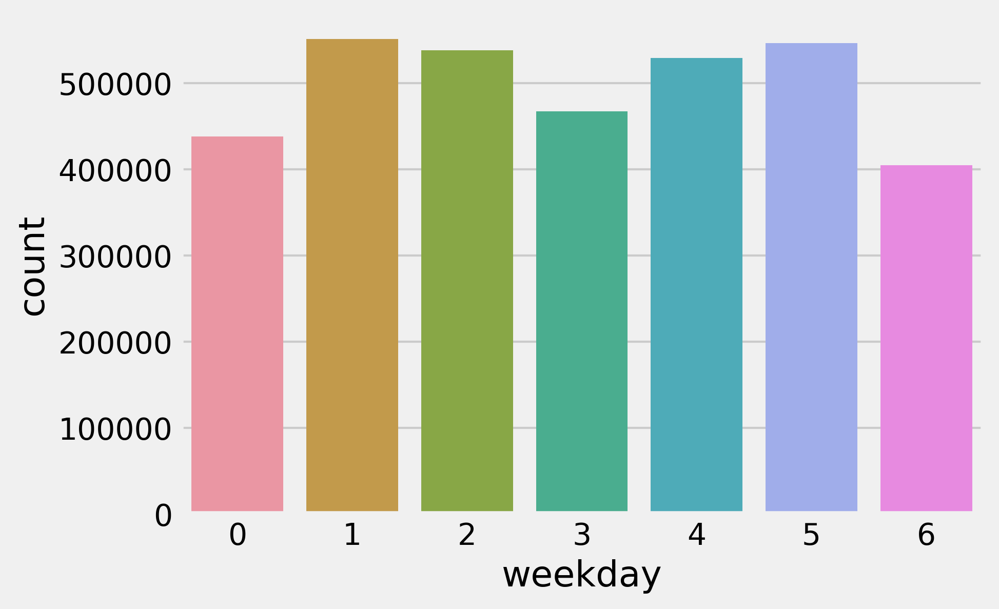

In [8]:
sns.countplot(x='weekday',data = citi)

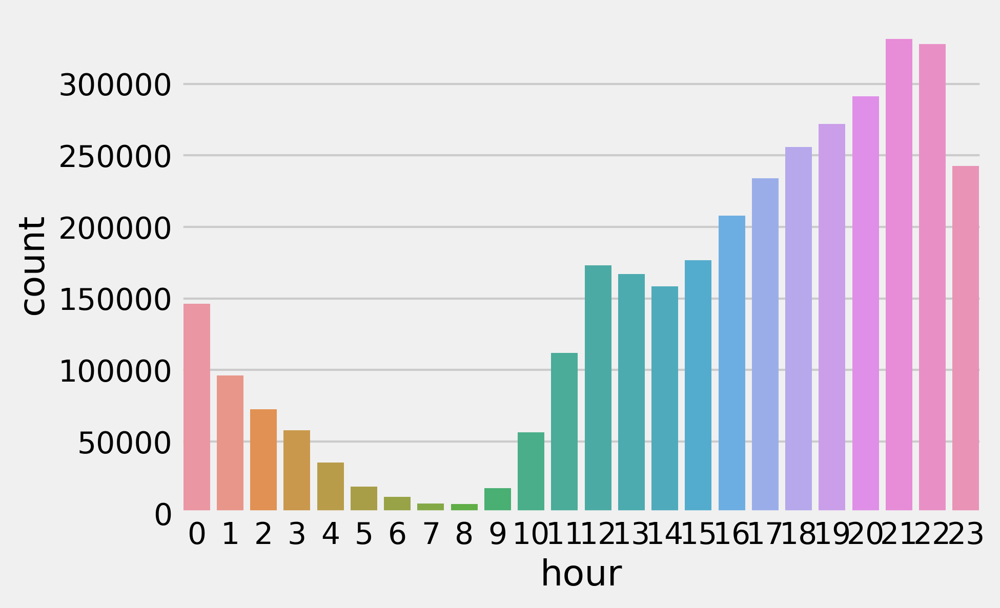

In [9]:
g = sns.countplot(data=citi, 
                   x="hour",
#                 y='weekday',
                  
                  )

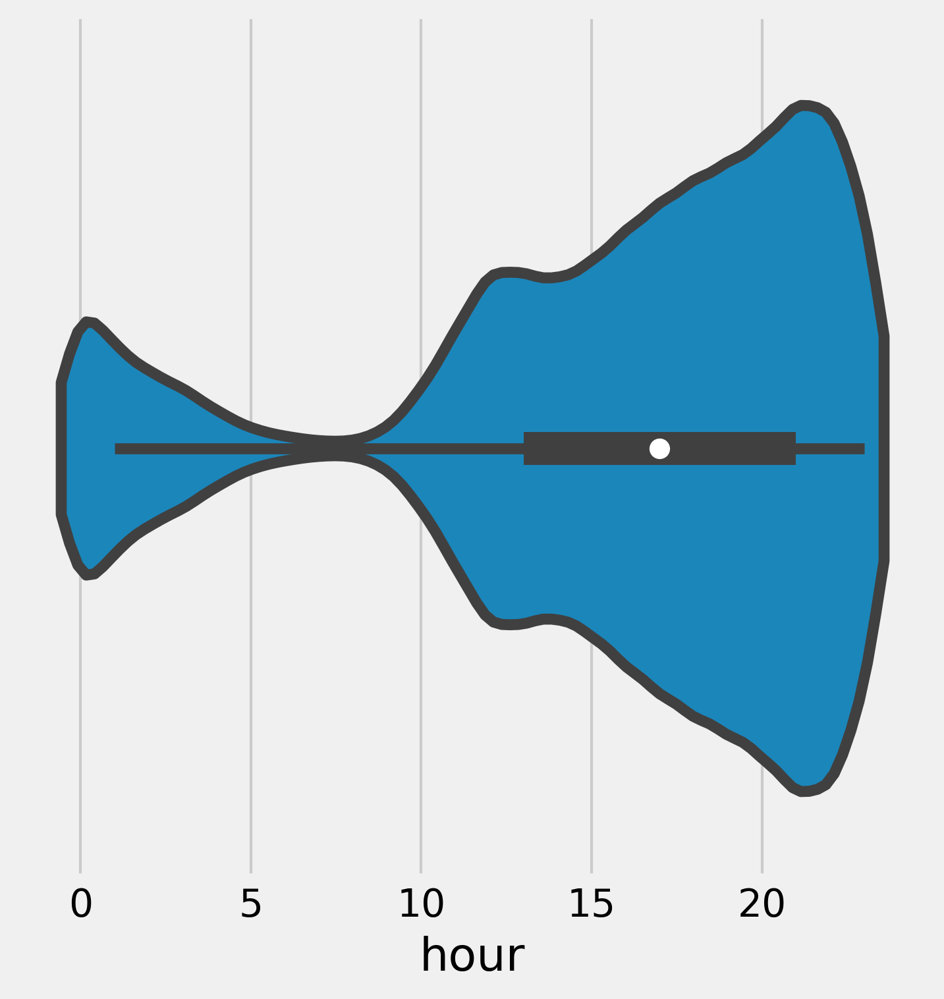

In [10]:
g = sns.catplot(data=citi, kind='violin',
                   x="hour",
#                 y='weekday',
                   orient='h',
                   cut = True,
                   bw = .09,
                   scale= 'count',
                  )

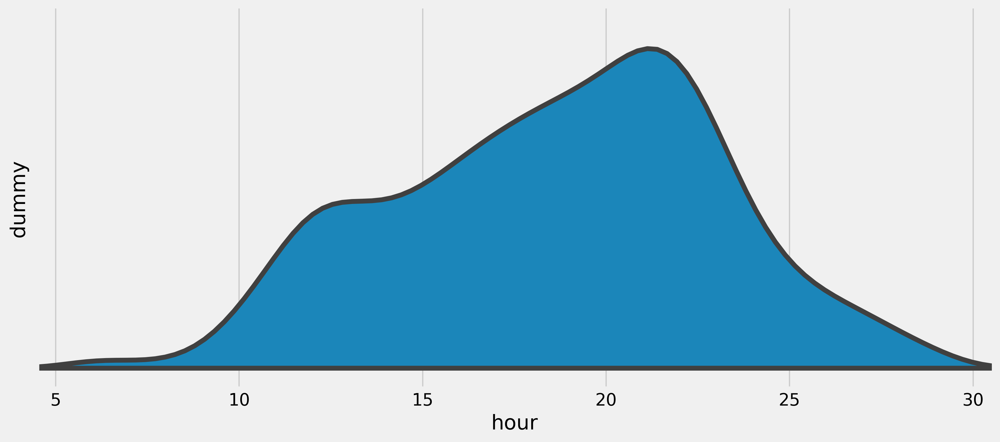

In [11]:
# Dummy variables necessary for graph aesthetic.
graph_ = citi
graph_['dummy_hue'] = 1
graph_ = graph_.append(pd.Series(-100, index=graph_.columns), ignore_index=True)
graph_['dummy'] = 1

graph_.loc[graph_["hour"] == 0, "hour"] = 24
graph_.loc[graph_["hour"] == 1, "hour"] = 25
graph_.loc[graph_["hour"] == 2, "hour"] = 26
graph_.loc[graph_["hour"] == 3, "hour"] = 27
graph_.loc[graph_["hour"] == 4, "hour"] = 28
graph_.loc[graph_["hour"] == 5, "hour"] = 29

# Creating viz
g= sns.catplot(hue="dummy_hue",y='dummy', x="hour",
            kind= 'violin',data=graph_,orient="h",
            split=True,bw = .2,


               inner=None,scale="area",legend=False,
            height=5, aspect=2.3,hue_order= [1, 0],
#                palette=colors.reverse()
              )
# Labels
# plt.tick_params(axis="x", bottom=False, top=True, 
#                 labelbottom=False, labeltop=True)
# g.set(xticks=[0,3,6,9,12,15,18,21,24])
# g.set(xticklabels=['Midnight','','6 a.m.','','Noon','',
#                    '6 p.m.','','Midnight'])
g.set(yticklabels=[])
# g.set(xlabel='', ylabel='',title='Distribution of When Forgetful Users Put On their Fitbit by Hour')
# Axis limits
plt.xlim([4.5,30.5])
plt.ylim([0.025,-.45])
plt.show()



(4.5, 30.5)

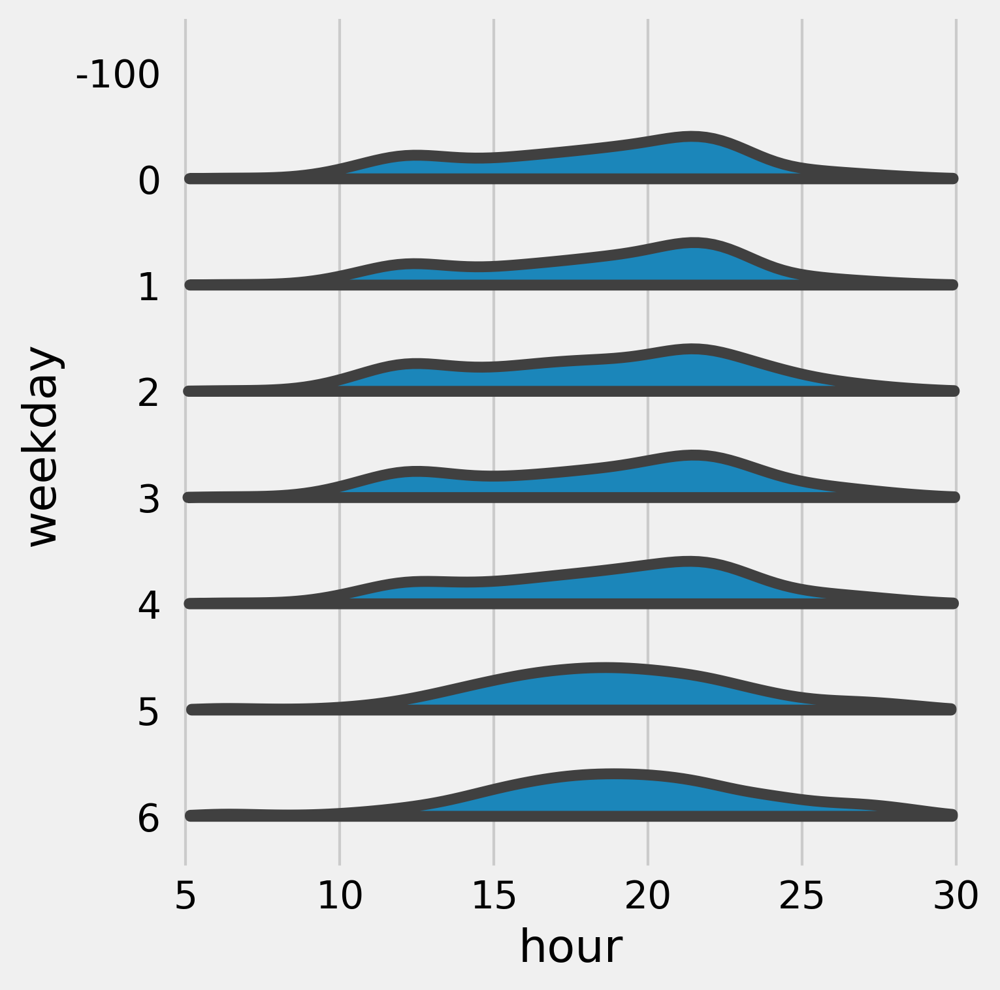

In [12]:
g = sns.catplot(data=graph_, kind='violin',
                   x="hour",y='weekday',hue="dummy_hue",
                   orient='h',
                   cut = True,
                   bw = .2,
                   scale= 'count',
                split=True,hue_order= [1, 0],legend=False
                  )

plt.xlim([4.5,30.5])



In [13]:
start_station_agg = citi.groupby(['hour','Start Station Name']).count()['start_zipcode'].sort_values().reset_index()
end_station_agg = citi.groupby(['hour','End Station Name']).count()['end_zipcode'].sort_values().reset_index()

station_count = pd.merge(start_station_agg, end_station_agg,  
                              how='inner', 
                              left_on=['Start Station Name','hour'], 
                              right_on = ['End Station Name','hour'])

station_count = station_count[['hour','Start Station Name',
                         'start_zipcode','end_zipcode']]
station_count.rename(columns={'Start Station Name':'station',
                           'start_zipcode':'leaving',
                           'end_zipcode':'arriving'},
                     inplace=True)

station_count['net'] = station_count['arriving']-station_count['leaving']
num_days = len(citi['Start Time'].dt.normalize().unique())
station_count['net_day'] = station_count['net']/num_days


(-3.0, 3.0)

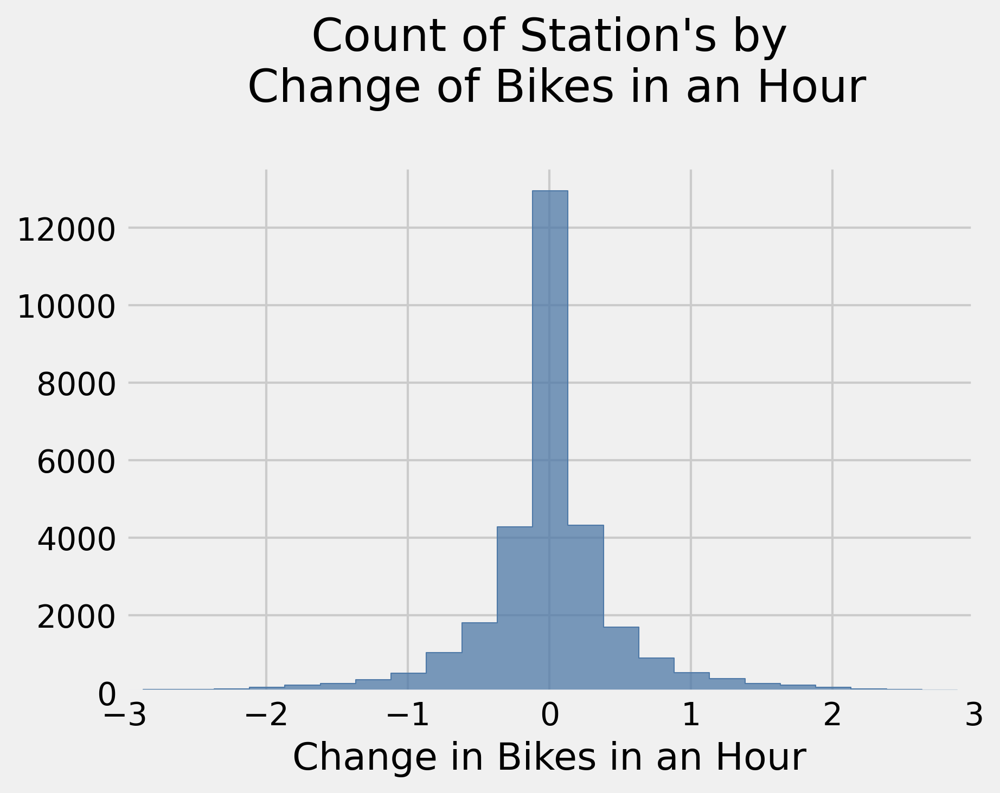

In [14]:
#funk with this to make it more clear that almost all the time the stations are in balance
g = sns.histplot(x='net_day', data=station_count,binwidth=.25, 
                 element="step", color= '#4e79a7',
#                  fill=False,
#                  stat="density", 
)
g.set(ylabel='', xlabel='Change in Bikes in an Hour',
      title="Count of Station's by\n Change of Bikes in an Hour\n")


plt.xlim(-3, 3)

In [15]:
station_crisis = station_count[~(abs(station_count['net_day'])<3)].reset_index(drop=True)
station_crisis['surplus'] = (station_crisis['net_day']>0).astype(int)
station_crisis['dummy'] = 1
station_crisis.loc[station_crisis["hour"] == 0, "hour"] = 24
station_crisis.loc[station_crisis["hour"] == 1, "hour"] = 25


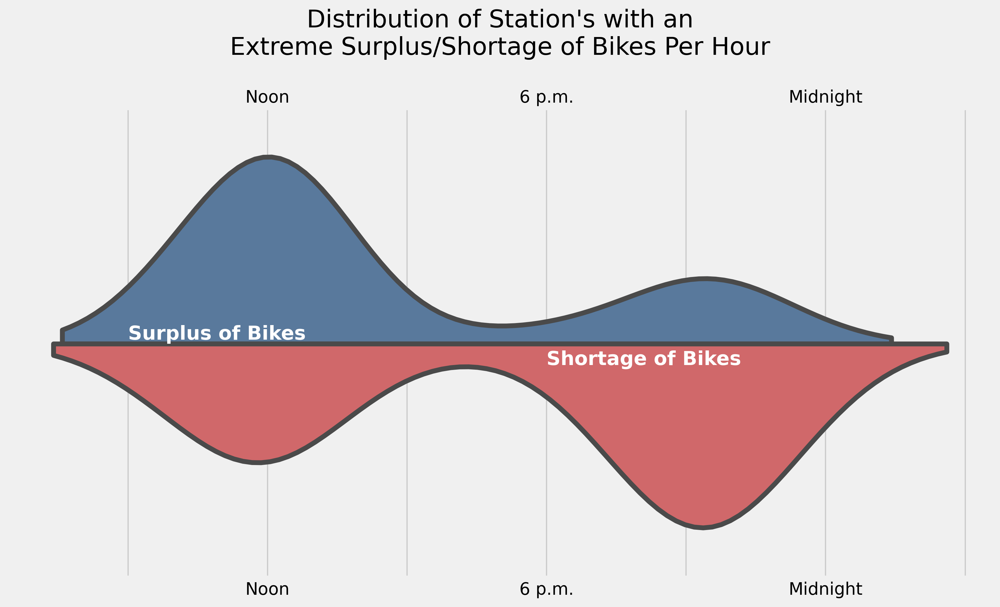

In [16]:
color = ['#4e79a7',
         '#e15759']
# THIS IS GREAT. but need to 
g = sns.catplot(data = station_crisis,kind='violin',
                   x='hour', y = 'dummy',hue = 'surplus',
                   scale='count',
                   cut = True,orient='h',
                   split=True,hue_order = [1,0],
                   palette = color,inner=None,legend=False,
                height=6,aspect=2
                  )

# Labels
plt.tick_params(axis="x", bottom=True, top=True, labelbottom=True, labeltop=True)
g.set(xticks=[9,12,15,18,21,24,27])
g.set(xticklabels=['','Noon','',
                   '6 p.m.','','Midnight',''])
g.set(yticklabels=[])
# g.set(xticklabels=[])
plt.text(x = 9, y = -0.009,
               s = "Surplus of Bikes",
              fontsize=16,color='white',weight='bold')
plt.text(x = 18, y = 0.045,
               s = "Shortage of Bikes",
              fontsize=16,color='white',weight='bold')


g.set(xlabel='', ylabel='',title="Distribution of Station's with an\nExtreme Surplus/Shortage of Bikes Per Hour\n")

plt.show()

In [17]:
start_zip_count = citi['start_zipcode'].value_counts().reset_index()
end_zip_count = citi['end_zipcode'].value_counts().reset_index()
citi_zip_count = pd.merge(start_zip_count, end_zip_count,  
                              how='inner', 
                              left_on=['index'], 
                              right_on = ['index'])

citi_zip_count['net'] = citi_zip_count['end_zipcode']-citi_zip_count['start_zipcode']
num_days = len(citi['Start Time'].dt.normalize().unique())
citi_zip_count['net_day'] = citi_zip_count['net']/num_days
citi_zip_count['total_trips'] = citi_zip_count['end_zipcode']+citi_zip_count['start_zipcode']



In [18]:
graph_ =  citi_zip_count.sort_values('total_trips',ascending=False).iloc[:10]
geo_graph_ = gnyc_zip.merge(graph_, right_on='index' ,left_on='ZIPCODE')

zips_code = list(graph_['index'])

color = ['#4e79a7',
         '#f28e2b',
         '#e15759',
         '#76b7b2',
         '#59a14f',
         '#edc948',
         '#b07aa1',
         '#ff9da7',
         '#9c755f',
         '#bab0ac'] 
color_mapping = dict(zip(zips_code,color))

fig,axs = plt.subplots(1,2,figsize = (45, 30))

zip_boundry_map = gnyc_zip.boundary.plot(color='Black', linewidth=.5,ax=axs[1])
geo_graph_.plot(color=geo_graph_["ZIPCODE"].map(color_mapping),ax=zip_boundry_map)
zip_boundry_map.axis('off')

minx, miny, maxx, maxy = geo_graph_.total_bounds
axs[1].set_xlim(minx, maxx)
axs[1].set_ylim(miny, maxy)

g = sns.barplot(x='index',y="total_trips", 
                  data=citi_zip_count,
                  order = graph_['index'],
                  palette=color,
                  ax=axs[0]
                  )
g.set(xlabel='Zip Codes', ylabel='Trip Counts',title='')
fig.tight_layout()
g.set(yticks=[0,50000,100000,150000,200000,250000,300000,])
# g.set(yticklabels=['-60','','-40','','-20','','0','','20','','40',''])
axs[0].set_yticklabels(labels=[0,50000,100000,150000,200000,250000,300000,],fontsize=32)
axs[0].set_xticklabels(labels = ['10009','10003','10011','10019','10002',
                                 '10014','10016','10025','10010','10018'],
                       fontsize=32)
g.set(xlabel='', ylabel='',title='')

fig.suptitle('Total Trips by Zip Code', fontsize=64)


plt.show()



In [19]:
zipcode_10 = list(citi_zip_count.sort_values('total_trips',
                                            ascending=False).iloc[:10]['index'])
citi_top_10 = citi[((citi['start_zipcode'].isin(zipcode_10))
                    |
                    (citi['end_zipcode'].isin(zipcode_10)))]


In [20]:
zipcode_10

['10009',
 '10003',
 '10011',
 '10019',
 '10002',
 '10014',
 '10016',
 '10025',
 '10010',
 '10018']

In [21]:
start_zip_agg = citi_top_10.groupby(['hour','start_zipcode']).count()['Start Station Name'].sort_values().reset_index()
end_zip_agg = citi_top_10.groupby(['hour','end_zipcode']).count()['End Station Longitude'].sort_values().reset_index()


citi_zip_count_10 = pd.merge(start_zip_agg, end_zip_agg,  
                              how='inner', 
                              left_on=['start_zipcode','hour'], 
                              right_on = ['end_zipcode','hour'])
citi_zip_count_10.start_zipcode.fillna(citi_zip_count_10.end_zipcode, inplace=True)

citi_zip_count_10.rename(columns={'Start Station Name':'leaving',
                           'End Station Longitude':'arriving',
                           'start_zipcode':'zipcode'},
                 inplace=True)
citi_zip_count_10 = citi_zip_count_10[['zipcode','hour','leaving',
                                     'arriving']]

citi_zip_count_10['net'] = citi_zip_count_10['arriving']-citi_zip_count_10['leaving']
num_days = len(citi['Start Time'].dt.normalize().unique())
citi_zip_count_10['net_day'] = citi_zip_count_10['net']/num_days





In [22]:
graph_df = citi_zip_count_10[citi_zip_count_10['zipcode'].isin(zipcode_10)]
graph_df.loc[graph_df["hour"] == 0, "hour"] = 24
graph_df.loc[graph_df["hour"] == 1, "hour"] = 25
graph_df.loc[graph_df["hour"] == 2, "hour"] = 26
graph_df.loc[graph_df["hour"] == 3, "hour"] = 27
graph_df.loc[graph_df["hour"] == 4, "hour"] = 28
graph_df.loc[graph_df["hour"] == 5, "hour"] = 29

color = ['#4e79a7',
         '#f28e2b',
         '#e15759',
         '#76b7b2',
         '#59a14f',
         '#edc948',
         '#b07aa1',
         '#ff9da7',
         '#9c755f',
         '#bab0ac'] 
zips_code = list(citi_zip_count.sort_values('total_trips',
                                            ascending=False).iloc[:10]['index'])
color_mapping = dict(zip(zips_code,color))


fig,axs = plt.subplots(1,2,figsize = (45, 30))

zip_boundry_map = gnyc_zip.boundary.plot(color='Black', linewidth=.5,ax=axs[1])
geo_graph_.plot(color=geo_graph_["ZIPCODE"].map(color_mapping),ax=zip_boundry_map)
zip_boundry_map.axis('off')

minx, miny, maxx, maxy = geo_graph_.total_bounds
axs[1].set_xlim(minx, maxx)
axs[1].set_ylim(miny, maxy)

g = sns.lineplot(data=graph_df, 
                 x="hour", y="net_day",
                 hue='zipcode',ax=axs[0],
                 hue_order = citi_zip_count.sort_values('total_trips',
                                            ascending=False).iloc[:10]['index'],
                 palette=color_mapping,legend=False,linewidth = 15,
                )
axs[0].tick_params(axis="x", bottom=True, top=True, labelbottom=True, labeltop=True)
g.set(xticks=[6,9,12,15,18,21,24,27,29])
g.set(xticklabels=['6 a.m.','','Noon','',
                   '6 p.m.','','Midnight','','5 a.m.'])
axs[0].set_xticklabels(labels = ['6 a.m.','','Noon','',
                   '6 p.m.','','Midnight','','5 a.m.'],fontsize=32)

axs[0].tick_params(axis="y", left=True, right=True, labelleft=True, labelright=True)
g.set(yticks=[-60,-50,-40,-30,-20,-10,0,10,20,30,40,50])
g.set(yticklabels=['-60','','-40','','-20','','0','','20','','40',''])
axs[0].set_yticklabels(labels = ['-60','','-40','','-20','','0','','20','','40',''],fontsize=32)
g.set(xlabel='', ylabel='',title='')

fig.suptitle('Change in Bike Totals by Hour\n', fontsize=64)

fig.tight_layout()

plt.show()


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


In [23]:
graph_df = citi_zip_count_10[citi_zip_count_10['zipcode'].isin(zipcode_10)]
graph_df.loc[graph_df["hour"] == 0, "hour"] = 24
graph_df.loc[graph_df["hour"] == 1, "hour"] = 25
graph_df.loc[graph_df["hour"] == 2, "hour"] = 26
graph_df.loc[graph_df["hour"] == 3, "hour"] = 27
graph_df.loc[graph_df["hour"] == 4, "hour"] = 28
graph_df.loc[graph_df["hour"] == 5, "hour"] = 29

color = ['#4e79a7',
         '#a1a1a1',
         '#808080',
         '#a3a3a3',
         '#828282',
         '#c5c5c5',
         '#8f8f8f',
         '#bbbbbb',
         '#7e7e7e',
         '#b3b3b3'] 
zips_code = list(citi_zip_count.sort_values('total_trips',
                                            ascending=False).iloc[:10]['index'])
color_mapping = dict(zip(zips_code,color))


fig,axs = plt.subplots(1,2,figsize = (45, 30))

zip_boundry_map = gnyc_zip.boundary.plot(color='Black', linewidth=.5,ax=axs[1])
geo_graph_.plot(color=geo_graph_["ZIPCODE"].map(color_mapping),ax=zip_boundry_map)
zip_boundry_map.axis('off')

minx, miny, maxx, maxy = geo_graph_.total_bounds
axs[1].set_xlim(minx, maxx)
axs[1].set_ylim(miny, maxy)

g = sns.lineplot(data=graph_df, 
                 x="hour", y="net_day",
                 hue='zipcode',ax=axs[0],
                 hue_order = citi_zip_count.sort_values('total_trips',
                                            ascending=False).iloc[:10]['index'],
                 palette=color_mapping,legend=False,linewidth = 15,
                )
axs[0].tick_params(axis="x", bottom=True, top=True, labelbottom=True, labeltop=True)
g.set(xticks=[6,9,12,15,18,21,24,27,29])
g.set(xticklabels=['6 a.m.','','Noon','',
                   '6 p.m.','','Midnight','','5 a.m.'])
axs[0].set_xticklabels(labels = ['6 a.m.','','Noon','',
                   '6 p.m.','','Midnight','','5 a.m.'],fontsize=32)

axs[0].tick_params(axis="y", left=True, right=True, labelleft=True, labelright=True)
g.set(yticks=[-60,-50,-40,-30,-20,-10,0,10,20,30,40,50])
g.set(yticklabels=['-60','','-40','','-20','','0','','20','','40',''])
axs[0].set_yticklabels(labels = ['-60','','-40','','-20','','0','','20','','40',''],fontsize=32)
g.set(xlabel='', ylabel='',title='')

fig.suptitle('Change in Bike Totals by Hour in the East Village\n', fontsize=64)

fig.tight_layout()

plt.show()



/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:3607: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._set_item(key, value)


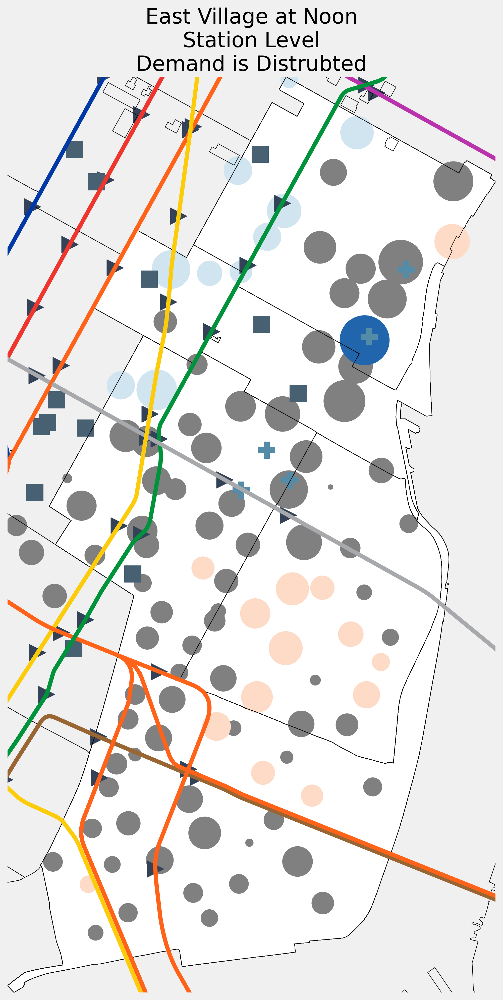

In [24]:
hour = 12

citi_hour = station_count[station_count['hour'] == hour]
citi_hour['total_trips'] = citi_hour['leaving'] + citi_hour['arriving']
citi_hour = citi_hour.merge(citi,how = 'left',
                        left_on = 'station', 
                        right_on = 'Start Station Name').drop_duplicates('station')
near_evil_zips = ['10009','10002','10003','10010','10016']
near_evil = citi_hour[citi_hour['start_zipcode'].isin(near_evil_zips)]
near_evil = near_evil[['station','net_day',
                       'Start Station Latitude','Start Station Longitude',
                       'start_zipcode','hour_x','total_trips']].reset_index(drop=True)

near_evil_zips = gnyc_zip.merge(near_evil, right_on='start_zipcode' ,left_on='ZIPCODE')

gnear_evil = geopandas.GeoDataFrame(
                near_evil, 
                geometry=geopandas.points_from_xy(near_evil['Start Station Longitude'], 
                                                  near_evil['Start Station Latitude']))
gnear_evil.loc[gnear_evil["net_day"] <= -12.5,
               "net_day_cat"] = -3
gnear_evil.loc[((gnear_evil["net_day"] > -12.5) & (gnear_evil["net_day"] <= -7.5)),
               "net_day_cat"] = -2
gnear_evil.loc[((gnear_evil["net_day"] > -7.5) & (gnear_evil["net_day"] <= -2.5)),
               "net_day_cat"] = -1
gnear_evil.loc[((gnear_evil["net_day"] > -2.5) & (gnear_evil["net_day"] <= 2.5)),
               "net_day_cat"] = 0
gnear_evil.loc[((gnear_evil["net_day"] > 2.5) & (gnear_evil["net_day"] <= 7.5)),
               "net_day_cat"] = 1
gnear_evil.loc[((gnear_evil["net_day"] > 7.5) & (gnear_evil["net_day"] <= 12.5)),
               "net_day_cat"] = 2
gnear_evil.loc[gnear_evil["net_day"] > 12.5, "net_day_cat"] = 3
cat_color_mapping = {-3:'#b2182b',
                     -2:'#ef8a62',
                     -1:'#fddbc7',
                     0:'grey',
                     1:'#d1e5f0',
                     2:'#67a9cf',
                     3:'#2166ac'}

fig,ax = plt.subplots(figsize = (15, 15))

zip_boundry_map = gnyc_zip.boundary.plot(color='Black', linewidth=.5,ax=ax)
near_evil_zips.plot(color='white', edgecolor='black',ax=zip_boundry_map)
gnear_evil.plot(ax=zip_boundry_map,
                color=gnear_evil["net_day_cat"].map(cat_color_mapping),
                markersize=near_evil['total_trips'],
                )

gsub_lines.plot(color=gsub_lines["rt_symbol"].map(subway_color_mapping),
                  ax=zip_boundry_map)
gsub_stations.plot(marker=">",markersize = 250,
                     ax=zip_boundry_map,color = '#334257')
ghealth.plot(ax=zip_boundry_map,marker="P",markersize = 250,color='#548CA8')
gschool.plot(ax=zip_boundry_map,marker="s",markersize = 250,color='#476072')

zip_boundry_map.axis('off')


minx, miny, maxx, maxy = near_evil_zips.total_bounds
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)
ax.set_title('East Village at Noon\nStation Level\nDemand is Distrubted');


plt.show()


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:3607: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._set_item(key, value)


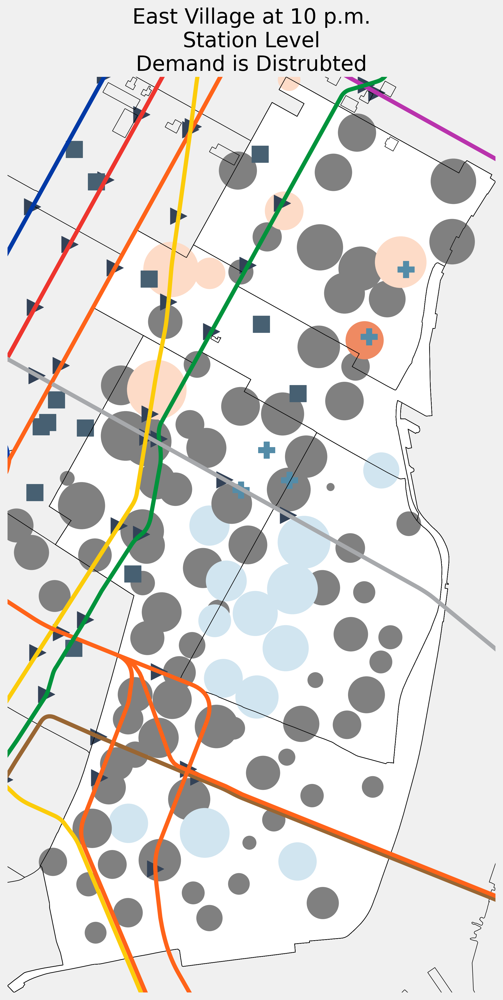

In [25]:
hour = 22

citi_hour = station_count[station_count['hour'] == hour]
citi_hour['total_trips'] = citi_hour['leaving'] + citi_hour['arriving']
citi_hour = citi_hour.merge(citi,how = 'left',
                        left_on = 'station', 
                        right_on = 'Start Station Name').drop_duplicates('station')

near_evil_zips = ['10009','10002','10003','10010','10016']
near_evil = citi_hour[citi_hour['start_zipcode'].isin(near_evil_zips)]
near_evil = near_evil[['station','net_day',
                       'Start Station Latitude','Start Station Longitude',
                       'start_zipcode','hour_x','total_trips']].reset_index(drop=True)

near_evil_zips = gnyc_zip.merge(near_evil, right_on='start_zipcode' ,left_on='ZIPCODE')

gnear_evil = geopandas.GeoDataFrame(
                near_evil, 
                geometry=geopandas.points_from_xy(near_evil['Start Station Longitude'], 
                                                  near_evil['Start Station Latitude']))

gnear_evil.loc[gnear_evil["net_day"] <= -12.5,
               "net_day_cat"] = -3
gnear_evil.loc[((gnear_evil["net_day"] > -12.5) & (gnear_evil["net_day"] <= -7.5)),
               "net_day_cat"] = -2
gnear_evil.loc[((gnear_evil["net_day"] > -7.5) & (gnear_evil["net_day"] <= -2.5)),
               "net_day_cat"] = -1
gnear_evil.loc[((gnear_evil["net_day"] > -2.5) & (gnear_evil["net_day"] <= 2.5)),
               "net_day_cat"] = 0
gnear_evil.loc[((gnear_evil["net_day"] > 2.5) & (gnear_evil["net_day"] <= 7.5)),
               "net_day_cat"] = 1
gnear_evil.loc[((gnear_evil["net_day"] > 7.5) & (gnear_evil["net_day"] <= 12.5)),
               "net_day_cat"] = 2
gnear_evil.loc[gnear_evil["net_day"] > 12.5, "net_day_cat"] = 3
cat_color_mapping = {-3:'#b2182b',
                     -2:'#ef8a62',
                     -1:'#fddbc7',
                     0:'grey',
                     1:'#d1e5f0',
                     2:'#67a9cf',
                     3:'#2166ac'}

fig,ax = plt.subplots(figsize = (15, 15))

zip_boundry_map = gnyc_zip.boundary.plot(color='Black', linewidth=.5,ax=ax)
near_evil_zips.plot(color='white', edgecolor='black',ax=zip_boundry_map)
gnear_evil.plot(ax=zip_boundry_map,
                color=gnear_evil["net_day_cat"].map(cat_color_mapping),
                markersize=near_evil['total_trips'],
                )

gsub_lines.plot(color=gsub_lines["rt_symbol"].map(subway_color_mapping),
                  ax=zip_boundry_map)
gsub_stations.plot(marker=">",markersize = 250,
                     ax=zip_boundry_map,color = '#334257')
ghealth.plot(ax=zip_boundry_map,marker="P",markersize = 250,color='#548CA8')
gschool.plot(ax=zip_boundry_map,marker="s",markersize = 250,color='#476072')

zip_boundry_map.axis('off')

#1e3d59, #f5f0e1, #ff6e40, #ffc13b

minx, miny, maxx, maxy = near_evil_zips.total_bounds
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)

ax.set_title('East Village at 10 p.m.\nStation Level\nDemand is Distrubted');



plt.show()

/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:3607: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._set_item(key, value)


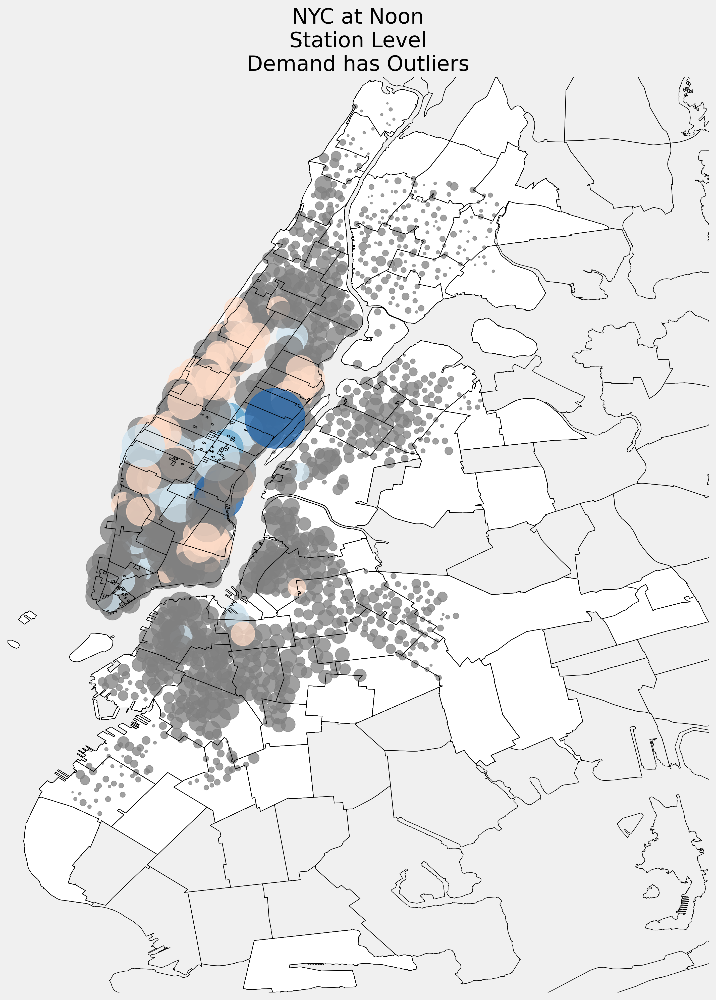

In [26]:
hour = 12

citi_hour = station_count[station_count['hour'] == hour]
citi_hour['total_trips'] = citi_hour['leaving'] + citi_hour['arriving']
citi_hour = citi_hour.merge(citi,how = 'left',
                        left_on = 'station', 
                        right_on = 'Start Station Name').drop_duplicates('station')

# near_evil_zips = ['10009','10002','10003','10010','10016']
near_evil = citi_hour
near_evil = near_evil[['station','net_day',
                       'Start Station Latitude','Start Station Longitude',
                       'start_zipcode','hour_x','total_trips']].reset_index(drop=True)

near_evil_zips = gnyc_zip.merge(near_evil, right_on='start_zipcode' ,left_on='ZIPCODE')

gnear_evil = geopandas.GeoDataFrame(
                near_evil, 
                geometry=geopandas.points_from_xy(near_evil['Start Station Longitude'], 
                                                  near_evil['Start Station Latitude']))

gnear_evil.loc[gnear_evil["net_day"] <= -12.5,
               "net_day_cat"] = -3
gnear_evil.loc[((gnear_evil["net_day"] > -12.5) & (gnear_evil["net_day"] <= -7.5)),
               "net_day_cat"] = -2
gnear_evil.loc[((gnear_evil["net_day"] > -7.5) & (gnear_evil["net_day"] <= -2.5)),
               "net_day_cat"] = -1
gnear_evil.loc[((gnear_evil["net_day"] > -2.5) & (gnear_evil["net_day"] <= 2.5)),
               "net_day_cat"] = 0
gnear_evil.loc[((gnear_evil["net_day"] > 2.5) & (gnear_evil["net_day"] <= 7.5)),
               "net_day_cat"] = 1
gnear_evil.loc[((gnear_evil["net_day"] > 7.5) & (gnear_evil["net_day"] <= 12.5)),
               "net_day_cat"] = 2
gnear_evil.loc[gnear_evil["net_day"] > 12.5, "net_day_cat"] = 3
cat_color_mapping = {-3:'#b2182b',
                     -2:'#ef8a62',
                     -1:'#fddbc7',
                     0:'grey',
                     1:'#d1e5f0',
                     2:'#67a9cf',
                     3:'#2166ac'}

fig,ax = plt.subplots(figsize = (15, 15))

zip_boundry_map = gnyc_zip.boundary.plot(color='Black', linewidth=.5,ax=ax)
near_evil_zips.plot(color='white', edgecolor='black',ax=zip_boundry_map)
gnear_evil.plot(ax=zip_boundry_map,
                color=gnear_evil["net_day_cat"].map(cat_color_mapping),
                markersize=near_evil['total_trips'],
                alpha=.75)

# gsub_lines.plot(color=gsub_lines["rt_symbol"].map(subway_color_mapping),
#                   ax=zip_boundry_map)
# gsub_stations.plot(marker="D",markersize = 250,
#                      ax=zip_boundry_map,color = '#2360A5')
zip_boundry_map.axis('off')



minx, miny, maxx, maxy = near_evil_zips.total_bounds
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)

ax.set_title('NYC at Noon\nStation Level\nDemand has Outliers');



plt.show()

/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:3607: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._set_item(key, value)


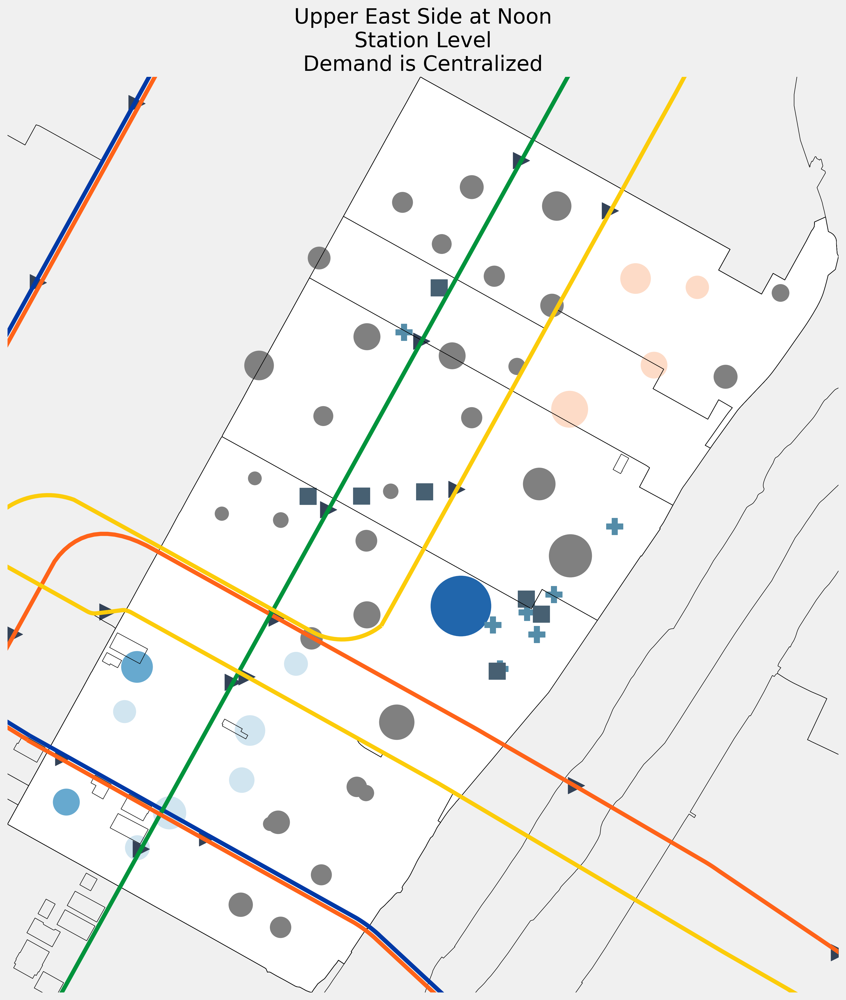

In [27]:

hour = 12

citi_hour = station_count[station_count['hour'] == hour]
citi_hour['total_trips'] = citi_hour['leaving'] + citi_hour['arriving']
citi_hour = citi_hour.merge(citi,how = 'left',
                        left_on = 'station', 
                        right_on = 'Start Station Name').drop_duplicates('station')

near_evil_zips = ['10021','10028','10065','10075','10022']

near_evil = citi_hour[citi_hour['start_zipcode'].isin(near_evil_zips)]
near_evil = near_evil[['station','net_day',
                       'Start Station Latitude','Start Station Longitude',
                       'start_zipcode','hour_x','total_trips']].reset_index(drop=True)

near_evil_zips = gnyc_zip.merge(near_evil, right_on='start_zipcode' ,left_on='ZIPCODE')

gnear_evil = geopandas.GeoDataFrame(
                near_evil, 
                geometry=geopandas.points_from_xy(near_evil['Start Station Longitude'], 
                                                  near_evil['Start Station Latitude']))

gnear_evil.loc[gnear_evil["net_day"] <= -12.5,
               "net_day_cat"] = -3
gnear_evil.loc[((gnear_evil["net_day"] > -12.5) & (gnear_evil["net_day"] <= -7.5)),
               "net_day_cat"] = -2
gnear_evil.loc[((gnear_evil["net_day"] > -7.5) & (gnear_evil["net_day"] <= -2.5)),
               "net_day_cat"] = -1
gnear_evil.loc[((gnear_evil["net_day"] > -2.5) & (gnear_evil["net_day"] <= 2.5)),
               "net_day_cat"] = 0
gnear_evil.loc[((gnear_evil["net_day"] > 2.5) & (gnear_evil["net_day"] <= 7.5)),
               "net_day_cat"] = 1
gnear_evil.loc[((gnear_evil["net_day"] > 7.5) & (gnear_evil["net_day"] <= 12.5)),
               "net_day_cat"] = 2
gnear_evil.loc[gnear_evil["net_day"] > 12.5, "net_day_cat"] = 3
cat_color_mapping = {-3:'#b2182b',
                     -2:'#ef8a62',
                     -1:'#fddbc7',
                     0:'grey',
                     1:'#d1e5f0',
                     2:'#67a9cf',
                     3:'#2166ac'}


fig,ax = plt.subplots(figsize = (15, 15))

zip_boundry_map = gnyc_zip.boundary.plot(color='Black', linewidth=.5,ax=ax)
near_evil_zips.plot(color='white', edgecolor='black',ax=zip_boundry_map)
gnear_evil.plot(ax=zip_boundry_map,
                color=gnear_evil["net_day_cat"].map(cat_color_mapping),
                markersize=near_evil['total_trips'],
                )

gsub_lines.plot(color=gsub_lines["rt_symbol"].map(subway_color_mapping),
                  ax=zip_boundry_map)
gsub_stations.plot(marker=">",markersize = 250,
                     ax=zip_boundry_map,color = '#334257')
ghealth.plot(ax=zip_boundry_map,marker="P",markersize = 250,color='#548CA8')
gschool.plot(ax=zip_boundry_map,marker="s",markersize = 250,color='#476072')
zip_boundry_map.axis('off')

ax.set_title('Upper East Side at Noon\nStation Level\nDemand is Centralized');



minx, miny, maxx, maxy = near_evil_zips.total_bounds
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)

plt.show()